# Stock Analysis

In [1]:
stock_ticker = 'VESUVIUS'          #Change ticker name here and re-run the notebook
ema          = (30,60,200)          #Set periods for Exponentail Moving Average
focus_period = 1000                 #Filter period for focus. If set only last 150 trading days data will be shown for analysis.

**Installing Package**

In [2]:
# Install package
%pip install --upgrade portfoliotools

Requirement already up-to-date: portfoliotools in /Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages (1.0.12)
You should consider upgrading via the 'pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [3]:
from portfoliotools.screener.stock_detail import StockDetail
from portfoliotools.screener.stock_fundamentals import StockFundamentals
#from portfoliotools.screener.screener_pattern import CandleStickPatters
from portfoliotools.screener.utility.util import NumToStr, flatten_dicts_of_dicts, backTestStrategy, slope, get_arima_predictions
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from IPython.display import display_html
from pandas.plotting import register_matplotlib_converters
from plotly.subplots import make_subplots
import nsetools

import warnings
warnings.filterwarnings("ignore")
register_matplotlib_converters()
%matplotlib inline
sns.set()
pd.options.display.max_columns = None
pd.options.display.max_rows = None

nse = nsetools.Nse()
if not nse.is_valid_code(stock_ticker) and "NIFTY" not in stock_ticker:
    raise(Exception("Not a Valid Ticker"))
def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)

In [4]:
stockObj = StockDetail(stock_ticker, period = focus_period)
stock_funda = StockFundamentals(stock_ticker)
details = stockObj.details()
details_funda = stock_funda.get_details_info()

ERROR:root:Error fetching Summary statistics info - VESUVIUS
ERROR:root:Error fetching Summary statistics info - VESUVIUS


### <font color = "red">Overview</font>

In [5]:
info = details['Overview']['Info']
info['Beta'] = details_funda.get('Beta (5Y monthly)')
df1 = pd.DataFrame(data = np.array(list(info.values())), index = np.array(list(info.keys())), columns = ['Overview'])
info = details['Overview']['52W Statistics']
df2 = pd.DataFrame(data = np.array(list(info.values())), index = np.array(list(info.keys())), columns = ['52W Stats'])
info = details['Overview']['Returns']
df3 = pd.DataFrame(data = np.array(list(info.values())), index = np.array(list(info.keys())), columns = ['Return Stats'])
info = details['Fundamental Analytics']
info['Trailing P/E'] = details_funda.get('Trailing P/E')
info['Forward P/E']  = details_funda.get('Forward P/E')
info['P/B']          = details_funda.get('Price/book')
info['PEG Ratio']    = details_funda.get('PEG Ratio (5 yr expected)')
info['Debt/Equity']  = details_funda.get('Total debt/equity')
info['ROA']          = details_funda.get('Return on assets')
info['ROE']          = details_funda.get('Return on equity')
df4 = pd.DataFrame(data = np.array(list(info.values())), index = np.array(list(info.keys())), columns = ['Fundamentals'])
info = flatten_dicts_of_dicts(details['Technical Analytics'])
df5 = pd.DataFrame( data = info.values(), index = np.array(list(info.keys())), columns = ['Technical Signals'])
cols = [col for col in df5.index.tolist() if 'Signal' in col or 'Portfolio' in col]
df5 = df5.loc[cols,:]
display_side_by_side(df1,df2,df3,df4,df5)

,Overview
Stock Name,VESUVIUS
Date,26Jun21
Last Close,1082.6
Last COB,25Jun21
Average Volume,9103.18
Standard Deviation,43.85
CAGR,1.21
Annual Volatility,34.88
Sharpe,-0.066
Sortino,-0.105


## <font color = 'red'>Fundamental Analysis</font>

### - Details 
    Balance sheet
    Cash Flow
    Key Statistics
    Income Statement

In [6]:
info = stock_funda.get_balance_sheet_info()
df1 = pd.DataFrame( data = NumToStr(info.values()), index = np.array(list(info.keys())), columns = ['Balance Sheet'])
info = stock_funda.get_financial_info()
df2 = pd.DataFrame( data = NumToStr(info.values()), index = np.array(list(info.keys())), columns = ['Financial Info'])
info = stock_funda.get_cash_flow_info()
df3 = pd.DataFrame( data = NumToStr(info.values()), index = np.array(list(info.keys())), columns = ['Cash Flow Info'])
info = stock_funda.get_key_statistics()
df4 = pd.DataFrame( data = NumToStr(info.values()), index = np.array(list(info.keys())), columns = ['Key Statistics'])
info = stock_funda.get_summary_statistics()
df5 = pd.DataFrame( data = NumToStr(info.values()), index = np.array(list(info.keys())), columns = ['Summary Statistics'])
display_side_by_side(df1, df3, df4, df2, df5)

ERROR:root:Error fetching Summary statistics info - VESUVIUS


,Balance Sheet
Assets,nan
Current assets,nan
Cash,nan
Cash and cash equivalents,"524,500.0"
Other short-term investments,"5,063,000.0"
Total cash,"5,587,500.0"
Net receivables,"1,633,900.0"
Inventory,"1,169,600.0"
Other current assets,"205,800.0"
CurrAsset,"8,643,600.0"


## <font color = "red">Technical Analysis</font>

In [7]:
data = stockObj.generate_moving_averages(exponential=ema)
data = data.tail(focus_period) # last 150 periods

### - Close Price vs Volumne

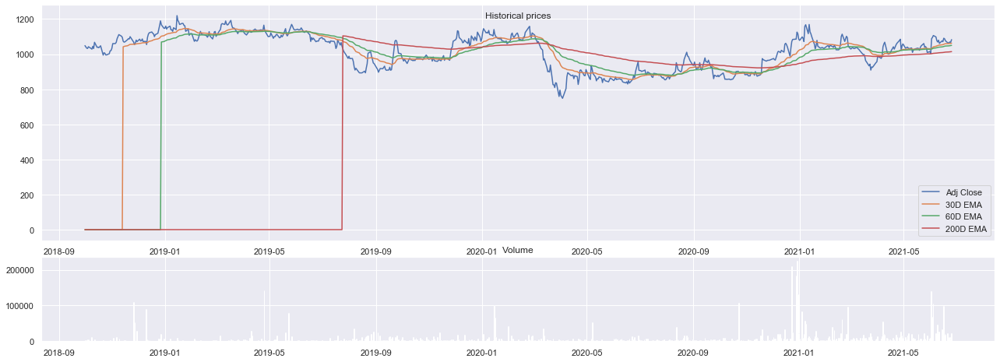

In [8]:
# Adjusted Close & Volumne - Historical
fig = plt.figure(figsize = (17,6))
fig.suptitle("Historical prices")

ax1 = fig.add_axes([0,.3,1,.7])
ax1.plot(data.index, data['Adj Close'], label = 'Adj Close')
ax1.legend()
for period in ema:
    col = '{0}D Exponential Moving Average'.format(period)
    label = '{0}D EMA'.format(period)
    ax1.plot( data.index, data[col], label = label)
    ax1.legend()

ax2 = fig.add_axes([0,0,1,.25])
ax2.set_title("Volume")
vol = data['Volume']#np.log10(data['Volume'])
#vol_cmap = data['Volume'].apply(lambda x, vol: 'rgb(250,0,0)' if x<vol else 'rgb(0,250,0)',vol = vol.mean())
ax2.bar(data.index, vol)
#ax2.set_ylim([vol.min()-.5, vol.max() + .5])
#ax2.plot(data.index, [vol.mean()]*len(vol), color = vol_cmap.tolist())
plt.show()

### Bollinger Bands

In [9]:
data = stockObj.get_bollinger_details().tail(focus_period)

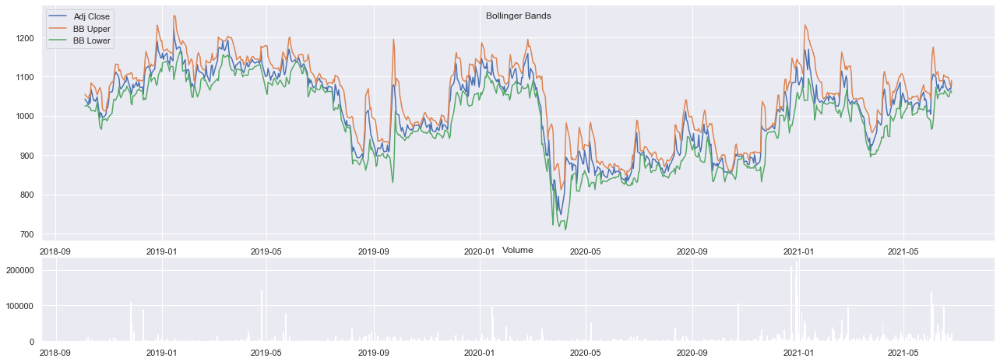

In [10]:
fig = plt.figure(figsize = (17,6))
fig.suptitle("Bollinger Bands")

ax1 = fig.add_axes([0,.3,1,.7])
ax1.plot(data.index, data['Adj Close'], label = 'Adj Close')
ax1.legend()
for part in ['Upper', 'Lower']:
    col = 'Bollinger Band {0}'.format(part)
    label = 'BB {0}'.format(part)
    ax1.plot( data.index, data[col], label = label)
    ax1.legend()

ax2 = fig.add_axes([0,0,1,.25])
ax2.set_title("Volume")
vol = data['Volume']
ax2.bar(data.index, vol)
plt.show()

### - Close Price Candle Stick

In [11]:
## Candle Stick - Historical
fig = go.Figure(data=[go.Candlestick(x=data.index,
                       open=data['Open'], high=data['High'],
                       low=data['Low'], close=data['Close'])])
#fig.layout.xaxis.type = 'category'
fig.show()

### - Williams R
**Description:** %D is 5 day smooth average of %R. Buy signal is triggered when %D is less than -75 and volume is more than 1.25 times avg 5 day volume. Sell signal is triggered when %D is more than -20 and volume is more than 1.25 times avg 5 day volume.

**Backtest Strategy**: Passive - Portfolio starts with 100% cash and there is no repump of cash into portfolio i.e. if there is a buy signal when no cash is in the portfolio, Buy order is not executed.
Active - Portfolio starts with 100% cash and at each Buy signal, initial cash is re-pumped into portfolio if there is not enough cash left for investment.

In [12]:
#data = stockObj.get_williams_r_details()[2] # To get williams R data frame
fig = stockObj.plot_williams_r_details(period = focus_period)
fig.show()

### - MACD
**Descrption**: MACD is momentum indicator. MACD Line is EMA(12D) - EMA(26D). MACD Indicator is exponential moving average of MACD.
When MACD Line crosses MACD Indicator from top, it's a BUY zone. When MACD Line crosses MACD Indicator from below, it's a SELL zone. BUY signal is generated when BUY Zone creates a maxima based on 9 day period. SELL signal is generated when SELL Zone creates a maxima.

**Backtest Strategy**: Passive - Portfolio starts with 100% cash and there is no repump of cash into portfolio i.e. if there is a buy signal when no cash is in the portfolio, Buy order is not executed.
Active - Portfolio starts with 100% cash and at each Buy signal, initial cash is re-pumped into portfolio if there is not enough cash left for investment.

In [13]:
fig = stockObj.plot_macd_details(period = focus_period)
fig.show()

### - RSI
**Descrption**: Relative Stregth Index(RSI) is momentum indicator. Relative Strength is calculated as ration of Average Gains to Average Loss. RS is then indexed to calculate RSI.

**Formula:** RS = Avg Gain/Avg Loss; 
RSI = 100 - 100/(1+RS)

Buy signal is given when RSI < 30.
Sell signal is given when RSI > 70.

**Backtest Strategy**: Passive - Portfolio starts with 100% cash and there is no repump of cash into portfolio i.e. if there is a buy signal when no cash is in the portfolio, Buy order is not executed.
Active - Portfolio starts with 100% cash and at each Buy signal, initial cash is re-pumped into portfolio if there is not enough cash left for investment.

In [14]:
fig = stockObj.plot_rsi_details(period = focus_period)
fig.show()

### - OBV
**Description:** OBV is a momentum indicator. BUY signal is triggered when OBV Index is less than 0 and rate of OBV Index change is more than 60. SELL signal is triggered when OBV Index is more than 0 and rate of OBV Index change is more than 60.

**Backtest Strategy**: Passive - Portfolio starts with 100% cash and there is no repump of cash into portfolio i.e. if there is a buy signal when no cash is in the portfolio, Buy order is not executed.
Active - Portfolio starts with 100% cash and at each Buy signal, initial cash is re-pumped into portfolio if there is not enough cash left for investment.

In [15]:
fig = stockObj.plot_obv_details(period = focus_period)
fig.show()

### ADX/ATR
**Description:**

**ADX Value  	        Trend Strength**

0-25	                Absent or Weak Trend

25-50	                Strong Trend

50-75	                Very Strong Trend

75-100	                Extremely Strong Trend


In [16]:
data = stockObj.get_adx_details()
data = data.join(stockObj.get_atr_details()['ATR'])
data.dropna(inplace = True)
data = data.tail(focus_period)

In [17]:
fig = make_subplots(rows = 3, cols = 1, shared_xaxes= True, vertical_spacing = 0.08, 
    column_widths = [15], row_heights = [2,2,2],
    specs=[[{"secondary_y": True}], [{"secondary_y": False}], [{"secondary_y": False}]])

hovertext      = ["<br>Close : " + "{:,}".format(np.round(txt['Close'],2)) + 
                    "<br>High: " + "{:,}".format(np.round(txt['High'],2)) + 
                    "<br>Low: " + "{:,}".format(np.round(txt['Low'],2)) + 
                    "<br>Volume: " + "{:,}".format(txt['Volume']) + 
                    "<br>ATR: " + "{:,}".format(np.round(txt['ATR'],2)) +
                    "<br>ADX: " + "{:,}".format(np.round(txt['ADX'],2))
                    for txt in data.to_dict(orient = "records")]
# Add Close Price
fig.add_trace(
go.Scatter(x=data.index, y=data['Close'], name="Close", text = hovertext, line = {'color':'purple'}), row = 2, col =1,
)
# Add ADX
fig.add_trace(
go.Scatter(x=data.index, y=data['ADX'], name="ADX", text = hovertext, line = {'color':'darkgray'}), row = 1, col =1,
)
# Add ATR
fig.add_trace(
go.Scatter(x=data.index, y=data['ATR'], name="ATR", text = hovertext, line = {'color':'black'}), row = 1, col =1,
secondary_y = True)                                                       
# Add Volume
fig.add_trace(
go.Scatter(x=data.index, y=data['Volume'], name="Volume", text = hovertext, line = {'color':'black'}), row = 3, col =1,
)
fig['layout']['yaxis1'].update(title='ADX')
fig['layout']['yaxis2'].update(title='ATR')
fig['layout']['yaxis3'].update(title='Close')
fig['layout']['yaxis4'].update(title='Volume')
fig.show()

### Combined Analysis

In [18]:
combined_analysis = stockObj.technical_details
combined_analysis.dropna()

Prices                                                   \
                   High          Low         Open        Close    Volume   
Date                                                                       
2018-10-12  1085.456479  1027.740071  1084.825940  1067.414062    5002.0   
2018-10-15  1065.134407  1035.015129  1065.134407  1038.313232    1017.0   
2018-10-16  1042.823792  1030.164938  1038.313159  1040.301636     621.0   
2018-10-23  1016.584766   979.578341   991.849163  1007.854553     546.0   
2018-10-24  1008.970093   987.726552  1003.489436  1004.701965     970.0   
2018-10-25  1010.813190   984.622492   985.350010   995.244263     282.0   
2018-10-26  1013.674691   983.603959   991.412637   995.826233    1467.0   
2018-10-29  1010.813166   987.484050  1009.600636  1002.179932     607.0   
2018-10-30  1028.128105   989.521116   999.124374  1018.621826    2859.0   
2018-10-31  1028.273491   999.124237  1011.637564  1020.076721     493.0   
2018-11-01  1045.636867  1008.824519  1009.745994  1033.123657    1208.0   
2018-11-02  1067.025945  1029.195025  1048.546948  1059.799316   10220.0   
2018-11-05  1084.437846  1047.625497  1069.887492  1060.187256    1464.0   
2018-11-06  1074.786245  1039.865393  1061.011956  1066.929077   10494.0   
2018-11-07  1099.036748  1065.085922  1069.887491  1087.541992     747.0   
2018-11-09  1115.575800  1072.846209  1100.394905  1111.210693    6676.0   
2018-11-12  1140.699108  1091.373435  1110.725476  1102.383179     993.0   
2018-11-13  1110.822654  1081.576416  1096.805740  1095.690308     598.0   
2018-11-14  1110.483103  1067.996020  1084.243916  1073.816162     610.0   
2018-11-15  1090.306599  1066.977483  1089.821587  1068.287109    3576.0   
2018-11-16  1077.744860  1062.175932  1067.074599  1069.887573    2844.0   
2018-11-19  1085.892983  1062.272930  1085.892983  1082.109985    1093.0   
2018-11-20  1096.175306  1067.220005  1082.158393  1087.833008     935.0   
2018-11-21  1087.832917  1068.480994  1087.832917  1086.135376     461.0   
2018-11-22  1109.658515  1079.781857  1094.817224  1099.473267     461.0   
2018-11-26  1109.707001  1067.995986  1099.473205  1069.062988  108958.0   
2018-11-27  1078.666315  1051.020641  1075.707696  1054.173218   53996.0   
2018-11-28  1076.483677  1049.516974  1049.516974  1062.418335     719.0   
2018-11-29  1091.276597  1049.614129  1063.242890  1079.927368   29144.0   
2018-11-30  1078.763166  1053.445575  1072.021550  1071.245483     848.0   
2018-12-03  1090.306614  1064.989019  1078.569351  1085.213989     436.0   
2018-12-04  1090.791515  1068.480973  1074.834674  1075.125610    1178.0   
2018-12-05  1089.336618  1060.332885  1075.125747  1076.192749     846.0   
2018-12-06  1091.276596  1061.205864  1066.734951  1086.377930     586.0   
2018-12-07  1106.748470  1068.335556  1077.308275  1071.973145     656.0   
2018-12-10  1081.576376  1052.475666  1067.171548  1072.458130   90898.0   
2018-12-11  1069.887554  1051.505653  1063.048958  1054.173218    4549.0   
2018-12-12  1096.126702  1046.606948  1058.538286  1094.720215    2245.0   
2018-12-13  1123.238853  1079.878843  1093.265217  1113.247681    1430.0   
2018-12-14  1141.669250  1098.454769  1113.247629  1121.541260    2212.0   
2018-12-17  1129.107423  1098.066669  1121.250256  1126.148804    1450.0   
2018-12-18  1124.160325  1108.785475  1121.250254  1118.825195     153.0   
2018-12-19  1124.208831  1101.946836  1117.370235  1115.624146    1099.0   
2018-12-20  1119.698371  1086.426512  1119.504295  1099.667358     821.0   
2018-12-21  1119.407282  1089.870109  1101.946856  1110.774048     870.0   
2018-12-24  1144.434022  1101.898387  1114.363287  1118.728394    6330.0   
2018-12-26  1168.878465  1096.563156  1096.563156  1163.543335    6235.0   
2018-12-27  1202.829280  1161.118264  1163.979787  1189.491455   20397.0   
2018-12-28  1201.762261  1164.998343  1199.628138  1166.986938    1288.0   
2018-12-31  1166.938395  1138.419678  1164.610315  1146.955933   

## <font color = "red">Predictions </font>

### ARIMA

,MSE,SMAPE KUN,Pred Value,Pred Low 5%,Pred High 5%
0,548.825,4.689,[1081.77],1039.5,1124.04


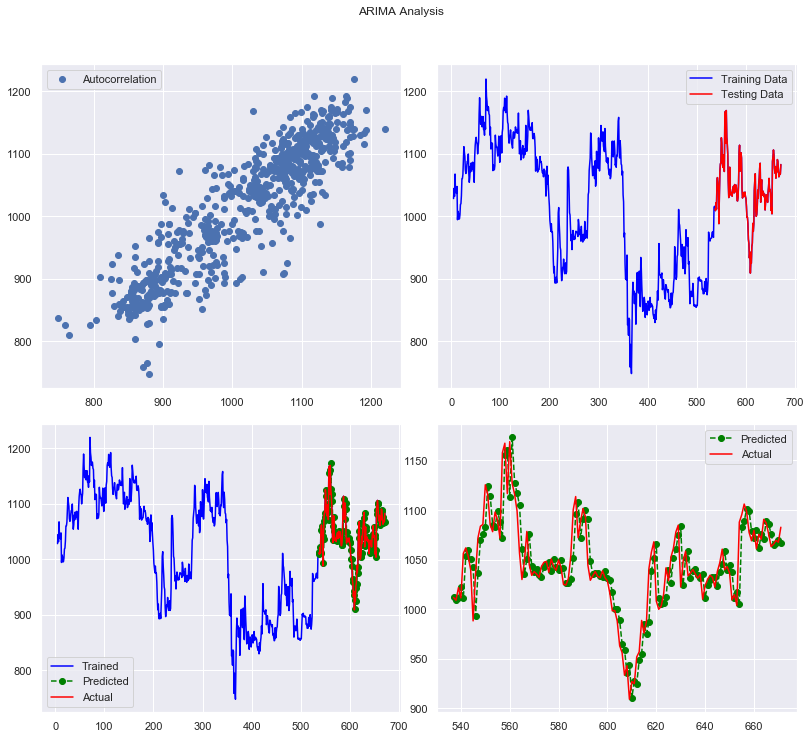

In [19]:
data = stockObj.historical_prices['Close'].values
result = get_arima_predictions(data, plot = True)
pd.DataFrame([result[0]])